In [ ]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

if IN_COLAB:
    # Create log folder
    !mkdir /content/lightning_logs
    # Download data from google drive
    !wget --output-document data.zip 'https://docs.google.com/uc?export=download&id=1PvPkD7loC9dB3eHfHv6lCu9uHQHqLNsR&confirm=t'
    !unzip -n data.zip -d /content/data
    # Download main script from github
    !wget --output-document amoug.py https://raw.githubusercontent.com/TuchthamSung086/among-us-counter/test_cnn/ML/amoug.py
    # Install dependecy
    !pip install pytorch-lightning  

Streaming output truncated to the last 5000 lines.
  inflating: /content/data/label105.png  
  inflating: /content/data/label1050.png  
  inflating: /content/data/label1051.png  
  inflating: /content/data/label1052.png  
  inflating: /content/data/label1053.png  
  inflating: /content/data/label1054.png  
  inflating: /content/data/label1055.png  
  inflating: /content/data/label1056.png  
  inflating: /content/data/label1057.png  
  inflating: /content/data/label1058.png  
  inflating: /content/data/label1059.png  
  inflating: /content/data/label106.png  
  inflating: /content/data/label1060.png  
  inflating: /content/data/label1061.png  
  inflating: /content/data/label1062.png  
  inflating: /content/data/label1063.png  
  inflating: /content/data/label1064.png  
  inflating: /content/data/label1065.png  
  inflating: /content/data/label1066.png  
  inflating: /content/data/label1067.png  
  inflating: /content/data/label1068.png  
  inflating: /content/data/label1069.png  
  inf

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

import torchvision as tv
from torchvision.transforms.functional import pil_to_tensor, to_tensor
from torchvision import transforms as T
import torch
from torch import nn
from torchsummary import summary
from torch.nn import functional as F
from torch.utils.data import DataLoader, random_split
import pytorch_lightning as pl

In [ ]:
from amoug import AmougRCNNModel, AmougDataset, collate_fn, visualize

In [ ]:
show = tv.transforms.ToPILImage()

## Prepare Dataset

In [ ]:
batch_size = 8   # Data loader's Batch size
visualize_size = 8  # no. of image use when visualize

### Dataset

In [ ]:
transform = T.Compose([
    T.RandomOrder([
        T.ColorJitter(brightness=0.5, hue=0.5, contrast=0.5),
        # T.RandomApply([T.ElasticTransform(alpha=100.)]),
        T.RandomGrayscale(),
        T.GaussianBlur(kernel_size=9, sigma=(0.1, 2.0)),
    ]),
    to_tensor
])

ds = AmougDataset("data", transform=transform)
train_ds, vaildate_ds = random_split(ds, [int(len(ds)*0.8), int(len(ds)*0.2)])
train_ds, vaildate_ds

(<torch.utils.data.dataset.Subset at 0x7fe34dda8dd0>,
 <torch.utils.data.dataset.Subset at 0x7fe34dd569d0>)

### Data Loader

In [ ]:
train_data = DataLoader(train_ds, shuffle=True, batch_size=batch_size, collate_fn=collate_fn)
vaildate_data = DataLoader(vaildate_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn)

In [ ]:
# Take a sample batch for testing purposes

sample_batch = next(iter(train_data))

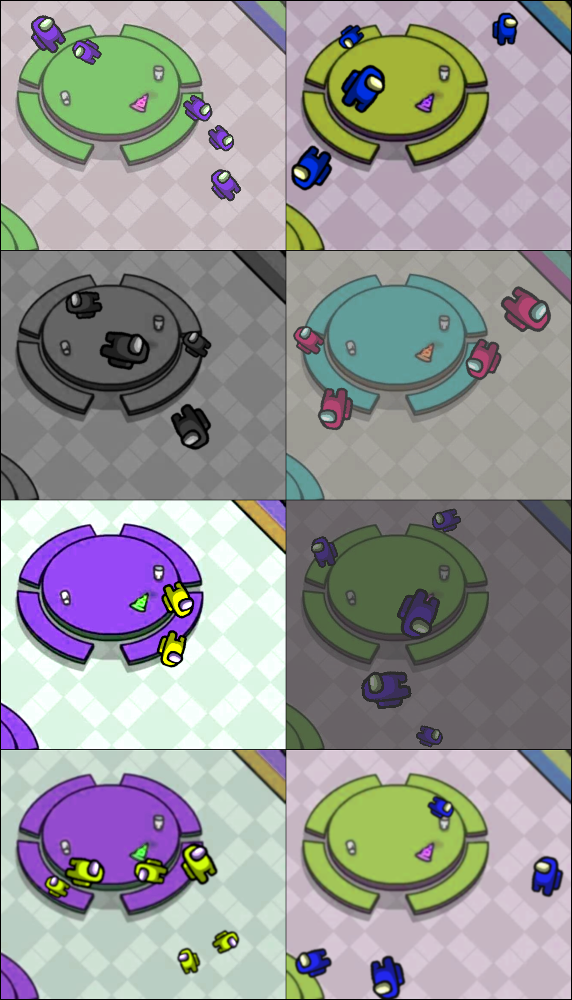

In [ ]:
show(tv.utils.make_grid(sample_batch[0][:visualize_size], nrow=int(np.sqrt(visualize_size))))

### Sanity Check

In [ ]:
if False:
  for imgs, targets in train_data:
    for target in targets:
      for x1, y1, x2, y2 in target['boxes']:
        assert (x2 > x1 and y2 > y1), target

## Model

In [ ]:
amoug_model = AmougRCNNModel()

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


  0%|          | 0.00/167M [00:00<?, ?B/s]

In [ ]:
trainer = pl.Trainer(accelerator="gpu")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
sample_batch[0].shape

torch.Size([8, 3, 582, 666])

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

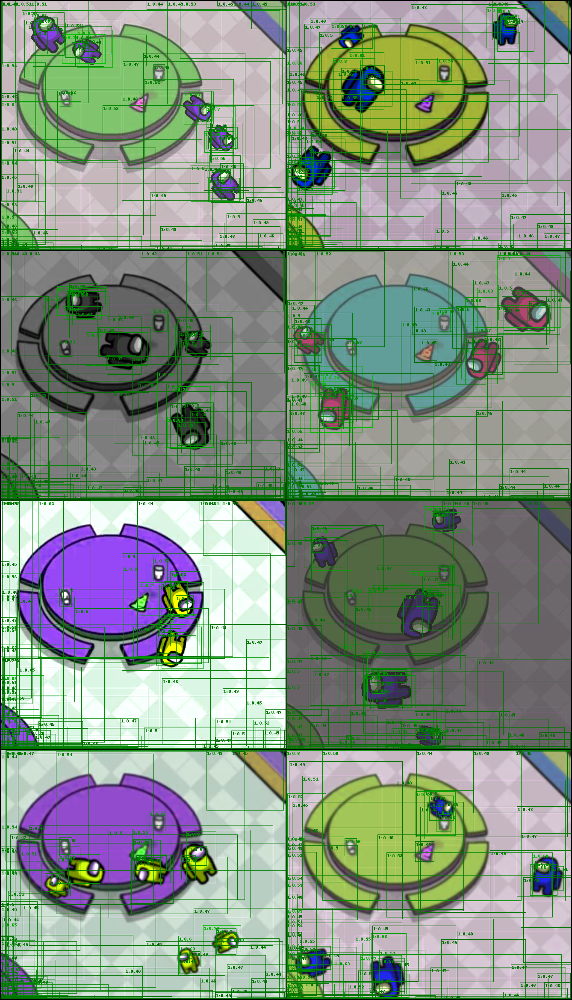

In [ ]:
# Visualize a pre-train prediction

results = trainer.predict(amoug_model, DataLoader(sample_batch[0]))
show(visualize(sample_batch[0], results))

In [ ]:
# Pre-train validation loss
trainer.validate(amoug_model, dataloaders=vaildate_data)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/data.py:86: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  "Trying to infer the `batch_size` from an ambiguous collection. The batch size we"


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        val_loss            1.1650160551071167
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 1.1650160551071167}]

### Training

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

In [ ]:
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
trainer = pl.Trainer(
    accelerator="gpu", 
    # max_epochs=1,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", verbose=True, min_delta=0.001),
        # Save best model (https://github.com/Lightning-AI/lightning/discussions/11787)
        ModelCheckpoint(save_top_k=1, monitor="val_loss", mode="min")
      ],
    # default_root_dir="/content/drive/MyDrive/Data/Amough/M1"
)

# This may train for a very long time
trainer.fit(model=amoug_model, train_dataloaders=train_data, val_dataloaders=vaildate_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type                 | Params
--------------------------------------------------
0 | model    | FasterRCNN           | 43.3 M
1 | test_map | MeanAveragePrecision | 0     
--------------------------------------------------
10.2 K    Trainable params
43.2 M    Non-trainable params
43.3 M    Total params
173.025   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.178


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.176


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.176. Signaling Trainer to stop.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 500it [00:00, ?it/s]

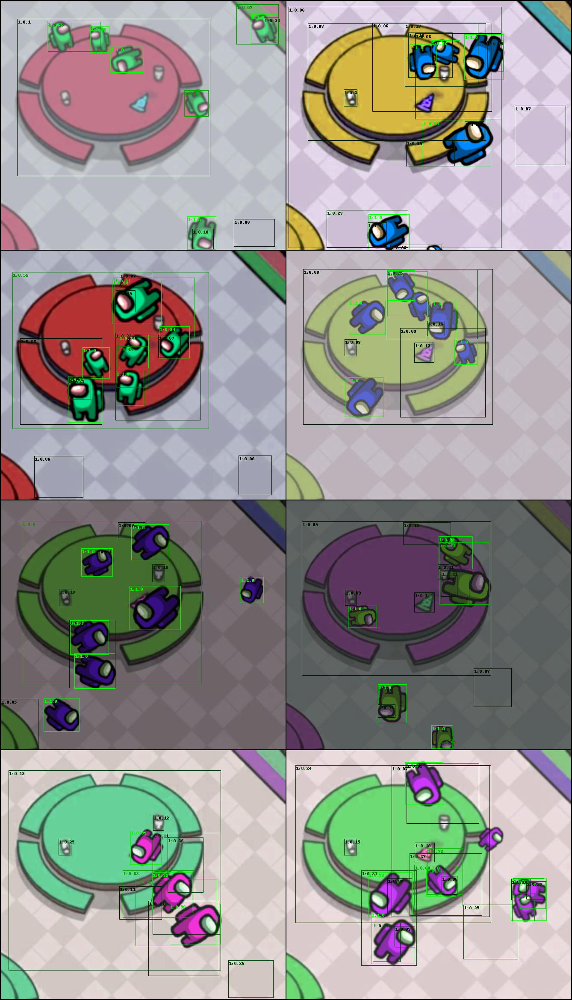

In [ ]:
# Visualize a post-train prediction
nsb = next(iter(train_data))[0]
results = trainer.predict(amoug_model, DataLoader(nsb))
show(visualize(nsb, results))

In [ ]:
if IN_COLAB:
  !zip -r lightning_logs.zip lightning_logs

  adding: lightning_logs/ (stored 0%)
  adding: lightning_logs/version_0/ (stored 0%)
  adding: lightning_logs/version_0/events.out.tfevents.1669812842.26d1fc25b5c9 (deflated 29%)
  adding: lightning_logs/version_0/events.out.tfevents.1669812832.26d1fc25b5c9 (deflated 29%)
  adding: lightning_logs/version_0/hparams.yaml (deflated 13%)
  adding: lightning_logs/version_1/ (stored 0%)
  adding: lightning_logs/version_1/checkpoints/ (stored 0%)
  adding: lightning_logs/version_1/checkpoints/epoch=7-step=4000.ckpt (deflated 7%)
  adding: lightning_logs/version_1/hparams.yaml (deflated 13%)
  adding: lightning_logs/version_1/events.out.tfevents.1669813558.26d1fc25b5c9 (deflated 64%)
